In [14]:
import sys
sys.path.append("/home/ipausers/lin/Desktop/Graduation/AMFtrack")
import os
import imageio.v2 as imageio
import matplotlib.pyplot as plt
import cv2
%matplotlib widget
%load_ext autoreload
%autoreload 2
from amftrack.pipeline.functions.image_processing.extract_graph import (
    from_sparse_to_graph,
    generate_nx_graph,
    clean_degree_4,
)
import scipy
from amftrack.pipeline.functions.image_processing.node_id import remove_spurs
from amftrack.pipeline.functions.image_processing.extract_skel import remove_component, remove_holes
import numpy as np
from amftrack.pipeline.development.high_mag_videos.high_mag_videos_fun import *
from scipy import signal
from amftrack.pipeline.functions.image_processing.extract_skel import (
    extract_skel_new_prince,
    run_back_sub,
    bowler_hat,
)
from scipy.interpolate import griddata

from skimage.morphology import skeletonize
from amftrack.util.sys import temp_path
import pandas as pd
from PIL import Image
from scipy.optimize import curve_fit
from amftrack.pipeline.functions.image_processing.extract_skel import (
    extract_skel_new_prince,
    run_back_sub,
    bowler_hat,
)
# plt.style.use('presentation.mplstyle')


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [15]:
# images_path = r"/mnt/sun/home-folder/Kaikai/Plate705_161122" #select images path 
images_path = "/home/ipausers/lin/Desktop/Graduation/data/Plate705_161122/"
binning = 1
magnification = 50
space_pixel_size = 2*1.725/(magnification)*binning
files = os.listdir(images_path)
images_total_path = [os.path.join(images_path,file) for file in files]
images_total_path.sort()

In [23]:
selection_file = images_total_path
selection_file.sort()
#select image index
begin  = 1
image = imageio.imread(selection_file[begin])
file_name = selection_file[begin].split('/')[-1].split('.')[0]
segmented,nx_graph_pruned,pos = segment_brightfield(image)

/tmp/ipykernel_3535438/150861678.py:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(selection_file[begin])
/home/ipausers/lin/Desktop/AMF/AMFtrack/amftrack/pipeline/functions/image_processing/extract_graph.py:170: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  graph = graph.append(pd.DataFrame(edges[branch]), ignore_index=True)


In [30]:
pos

{0: array([  0, 390]),
 6: array([ 60, 477]),
 1: array([  0, 541]),
 2: array([   3, 1627]),
 3: array([  23, 1599]),
 4: array([  25, 1569]),
 7: array([  65, 1604]),
 8: array([ 931, 1075]),
 5: array([  51, 1586]),
 9: array([1484,  946])}

In [28]:
edges = list(nx_graph_pruned.edges)
edges

[(6, 8), (3, 8), (8, 9)]

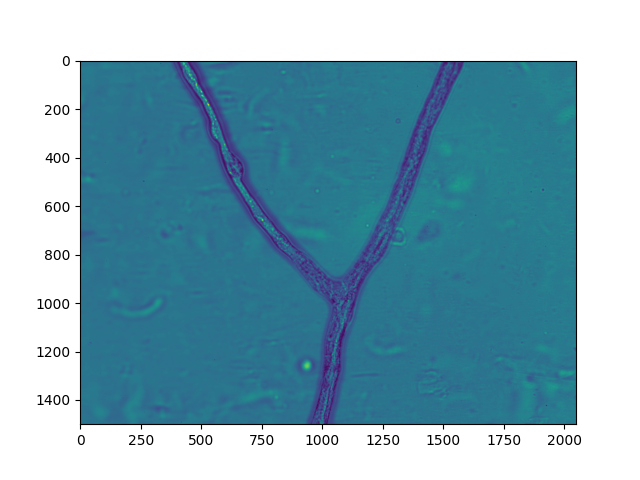

In [29]:
fig, ax = plt.subplots()
ax.imshow(image)

/tmp/ipykernel_3535438/801386996.py:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(selection_file[begin])
/home/ipausers/lin/Desktop/AMF/AMFtrack/amftrack/pipeline/functions/image_processing/extract_graph.py:170: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  graph = graph.append(pd.DataFrame(edges[branch]), ignore_index=True)


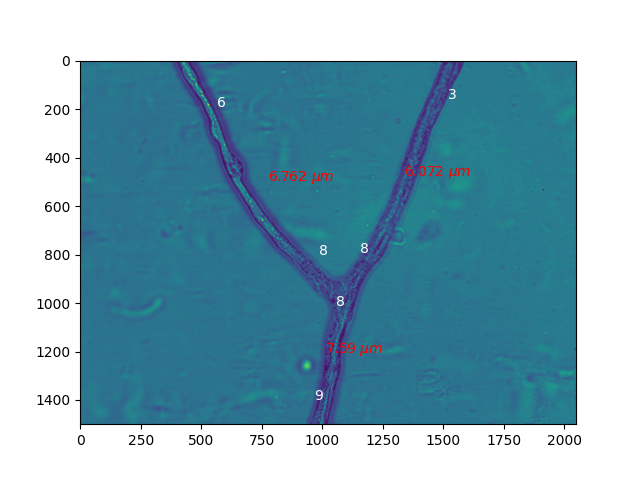

In [31]:
selection_file = images_total_path
selection_file.sort()
#select image index
begin  = 1
image = imageio.imread(selection_file[begin])
file_name = selection_file[begin].split('/')[-1].split('.')[0]
segmented,nx_graph_pruned,pos = segment_brightfield(image)

edges = list(nx_graph_pruned.edges)

fig, ax = plt.subplots()
ax.imshow(image)
bound1 = 0
bound2 = 1
offset=100
step=30
target_length=130
resolution = 1
weight = 0.15
for edge in edges:
    slices, segments = extract_section_profiles_for_edge(
    edge,
    pos,
    image,
    nx_graph_pruned,
    resolution=resolution,
    offset=offset,
    step=step,
    target_length=target_length,
    bound1=bound1,
    bound2=bound2
)
    #this is where the width for a given edge is calculated
    width = round(get_width_from_graph_im(edge,pos,image,nx_graph_pruned,slice_length=400)*space_pixel_size,4)
    #plotting edge label
    
    ax.text(*np.flip((1-weight) * pos[edge[0]]+weight*pos[edge[1]]),str(edge[0]),color="white")
    ax.text(*np.flip((1-weight) * pos[edge[1]]+weight*pos[edge[0]]),str(edge[1]),color="white")
    #plotting edge width
    
    ax.text(*np.flip((1-0.5) * pos[edge[1]]+0.5*pos[edge[0]]),f'{width} $\mu m$',color="red")

***doing it for all***

/tmp/ipykernel_3535438/4241186335.py:4: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(selection_file[begin])
/home/ipausers/lin/Desktop/AMF/AMFtrack/amftrack/pipeline/functions/image_processing/extract_graph.py:170: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  graph = graph.append(pd.DataFrame(edges[branch]), ignore_index=True)
/tmp/ipykernel_3535438/4241186335.py:4: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(selection_file[begin])
/home/ipausers/

2022-12-12 14:26:21,238-[ERROR]- extract_width_fun.py:88 -> The step is bigger than the offset. Offset should be raised


IndexError: list index out of range

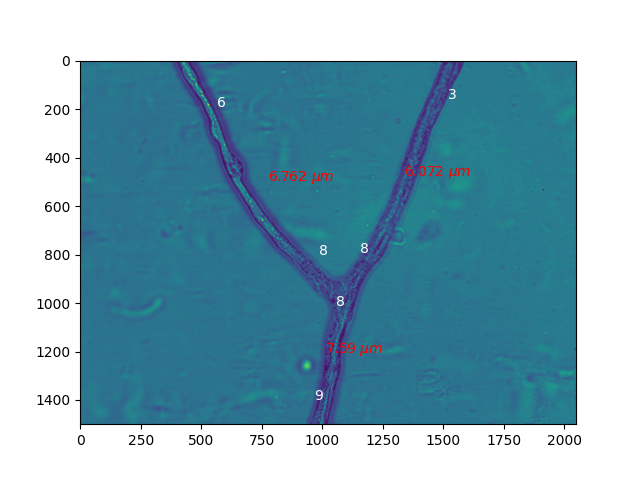

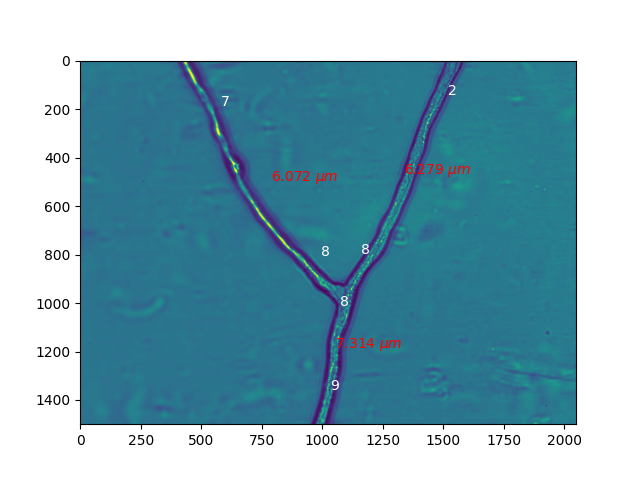

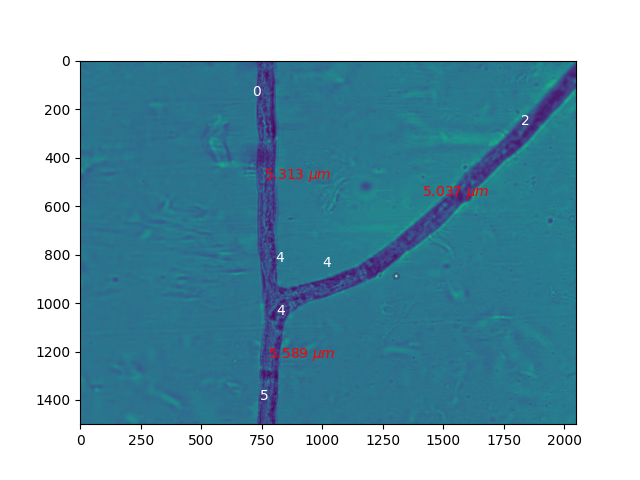

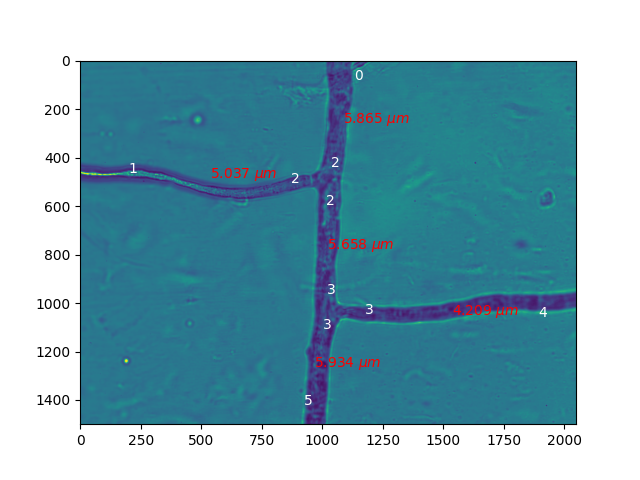

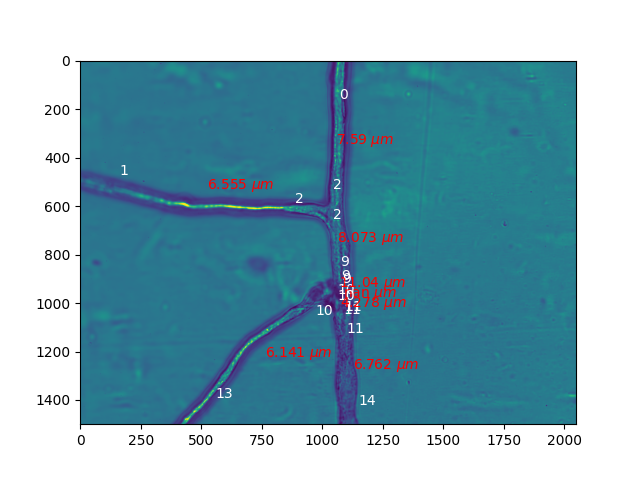

...

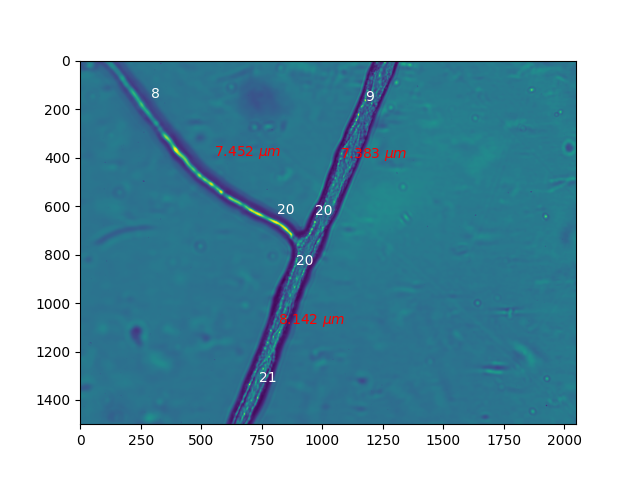

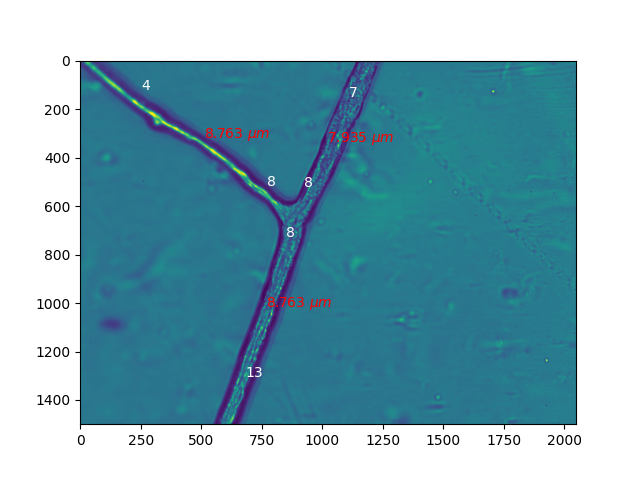

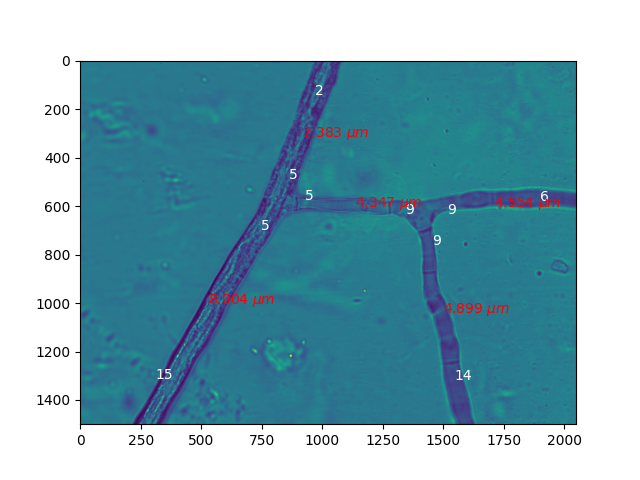

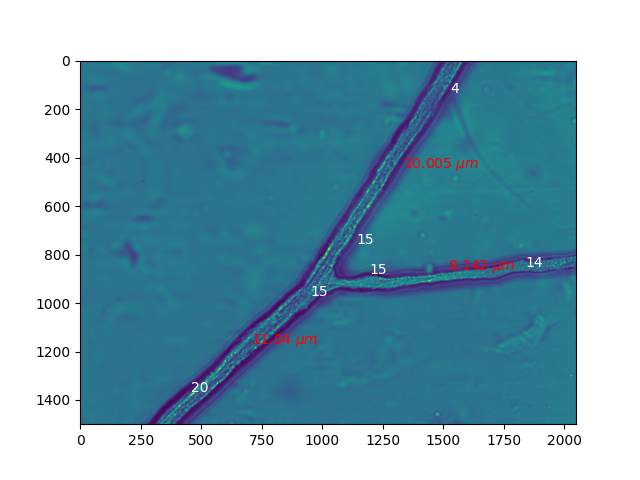

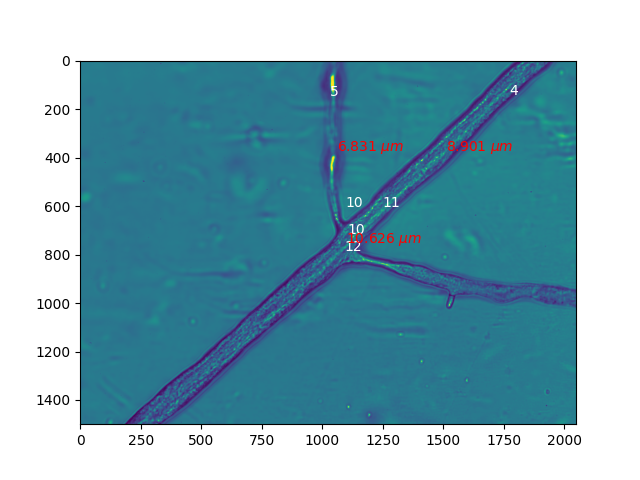

In [13]:
selection_file = images_total_path
selection_file.sort()
for begin in range(1,len(selection_file)):
    image = imageio.imread(selection_file[begin])
    file_name = selection_file[begin].split('/')[-1].split('.')[0]
    segmented,nx_graph_pruned,pos = segment_brightfield(image)
    edges = list(nx_graph_pruned.edges)

    fig, ax = plt.subplots()
    ax.imshow(image)
    bound1 = 0
    bound2 = 1
    offset=100
    step=30
    target_length=130
    resolution = 1
    weight = 0.15
    for edge in edges:
        slices, segments = extract_section_profiles_for_edge(
        edge,
        pos,
        image,
        nx_graph_pruned,
        resolution=resolution,
        offset=offset,
        step=step,
        target_length=target_length,
        bound1=bound1,
        bound2=bound2
    )
        width = round(get_width_from_graph_im(edge,pos,image,nx_graph_pruned,slice_length=400)*space_pixel_size,4)
        ax.text(*np.flip((1-weight) * pos[edge[0]]+weight*pos[edge[1]]),str(edge[0]),color="white")
        ax.text(*np.flip((1-weight) * pos[edge[1]]+weight*pos[edge[0]]),str(edge[1]),color="white")
        ax.text(*np.flip((1-0.5) * pos[edge[1]]+0.5*pos[edge[0]]),f'{width} $\mu m$',color="red")
